Accession: https://www.ncbi.nlm.nih.gov/geo/query/acc.cgi?acc=GSE133344

In [1]:
# %load block0_load.py
author_year = 'Norman_2019'
is_counts = True
var_genes = 'gene_symbols'
doi = '10.1126/science.aax4438'

import numpy as np
import pandas as pd
import scanpy as sc
sc.set_figure_params(dpi=100, frameon=False)
sc.logging.print_header()

# verify
assert(doi in pd.read_csv('../personal.csv').DOI.values)

adata = sc.read(f'{author_year}_raw.h5ad')
adata

/home/icb/yuge.ji/miniconda3/envs/py37/lib/python3.7/site-packages/scanpy/_settings.py:447: DeprecationWarning: `set_matplotlib_formats` is deprecated since IPython 7.23, directly use `matplotlib_inline.backend_inline.set_matplotlib_formats()`
  IPython.display.set_matplotlib_formats(*ipython_format)
2022-02-10 04:13:15.865398: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcudart.so.11.0'; dlerror: libcudart.so.11.0: cannot open shared object file: No such file or directory
2022-02-10 04:13:15.865497: I tensorflow/stream_executor/cuda/cudart_stub.cc:29] Ignore above cudart dlerror if you do not have a GPU set up on your machine.


scanpy==1.8.2 anndata==0.7.6 umap==0.5.2 numpy==1.20.3 scipy==1.5.3 pandas==1.3.4 scikit-learn==1.0.2 statsmodels==0.11.1 python-igraph==0.8.3 leidenalg==0.8.3 pynndescent==0.5.5


AnnData object with n_obs × n_vars = 111445 × 33694
    obs: 'guide_identity', 'read_count', 'UMI_count', 'coverage', 'gemgroup', 'good_coverage', 'number_of_cells', 'guide_AHR', 'guide_ARID1A', 'guide_ARRDC3', 'guide_ATL1', 'guide_BAK1', 'guide_BCL2L11', 'guide_BCORL1', 'guide_BPGM', 'guide_C19orf26', 'guide_C3orf72', 'guide_CBFA2T3', 'guide_CBL', 'guide_CDKN1A', 'guide_CDKN1B', 'guide_CDKN1C', 'guide_CEBPA', 'guide_CEBPB', 'guide_CEBPE', 'guide_CELF2', 'guide_CITED1', 'guide_CKS1B', 'guide_CLDN6', 'guide_CNN1', 'guide_CNNM4', 'guide_COL1A1', 'guide_COL2A1', 'guide_CSRNP1', 'guide_DLX2', 'guide_DUSP9', 'guide_EGR1', 'guide_ELMSAN1', 'guide_ETS2', 'guide_FEV', 'guide_FOSB', 'guide_FOXA1', 'guide_FOXA3', 'guide_FOXF1', 'guide_FOXL2', 'guide_FOXO4', 'guide_GLB1L2', 'guide_HES7', 'guide_HK2', 'guide_HNF4A', 'guide_HOXA13', 'guide_HOXB9', 'guide_HOXC13', 'guide_IER5L', 'guide_IGDCC3', 'guide_IKZF3', 'guide_IRF1', 'guide_ISL2', 'guide_JUN', 'guide_KIAA1804', 'guide_KIF18B', 'guide_KIF2C', '

,count,unique,top,freq,mean,std,min,25%,50%,75%,max
guide_identity,111445,290,NegCtrl10_NegCtrl0__NegCtrl10_NegCtrl0,3532,NaN,NaN,NaN,NaN,NaN,NaN,NaN
read_count,111445.0,NaN,NaN,NaN,1186.607268,858.953144,1.0,576.0,1074.0,1622.0,28684.0
UMI_count,111445.0,NaN,NaN,NaN,56.654036,37.853848,1.0,29.0,54.0,78.0,1809.0
coverage,111445.0,NaN,NaN,NaN,20.349891,6.730287,1.0,17.066667,19.839506,22.76,114.0
gemgroup,111445.0,NaN,NaN,NaN,4.477733,2.326137,1.0,2.0,4.0,7.0,8.0
good_coverage,111445,2,True,104507,NaN,NaN,NaN,NaN,NaN,NaN,NaN
number_of_cells,111445.0,NaN,NaN,NaN,1.072242,0.474838,0.0,1.0,1.0,1.0,10.0
guide_AHR,111445.0,NaN,NaN,NaN,0.0118,0.107983,0.0,0.0,0.0,0.0,1.0
guide_ARID1A,111445.0,NaN,NaN,NaN,0.002082,0.045579,0.0,0.0,0.0,0.0,1.0
guide_ARRDC3,111445.0,NaN,NaN,NaN,0.004442,0.066498,0.0,0.0,0.0,0.0,1.0


Index(['RP11-34P13.3', 'FAM138A', 'OR4F5', 'RP11-34P13.7', 'RP11-34P13.8',
       'RP11-34P13.14', 'RP11-34P13.9', 'FO538757.3', 'FO538757.2',
       'AP006222.2',
       ...
       'AC007325.2', 'BX072566.1', 'AL354822.1', 'AC023491.2', 'AC004556.1',
       'AC233755.2', 'AC233755.1', 'AC240274.1', 'AC213203.1', 'FAM231B'],
      dtype='object', name='gene_symbols', length=33694)


Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.


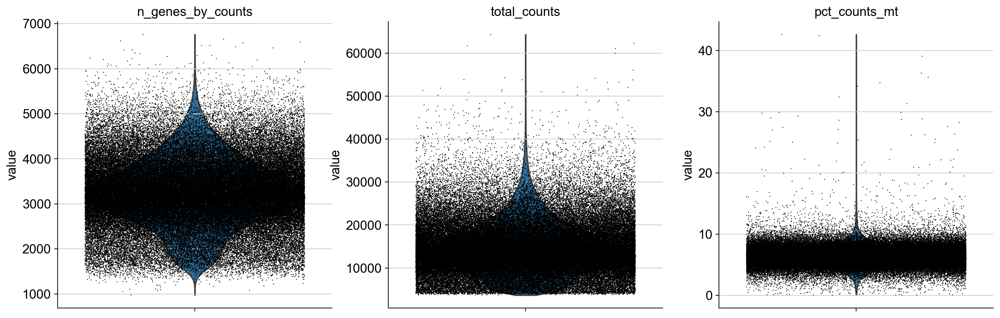

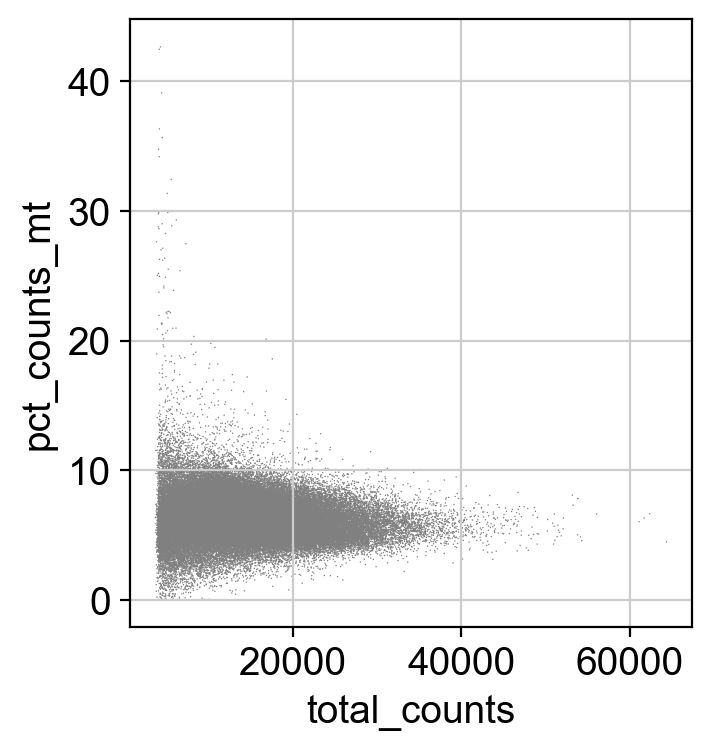

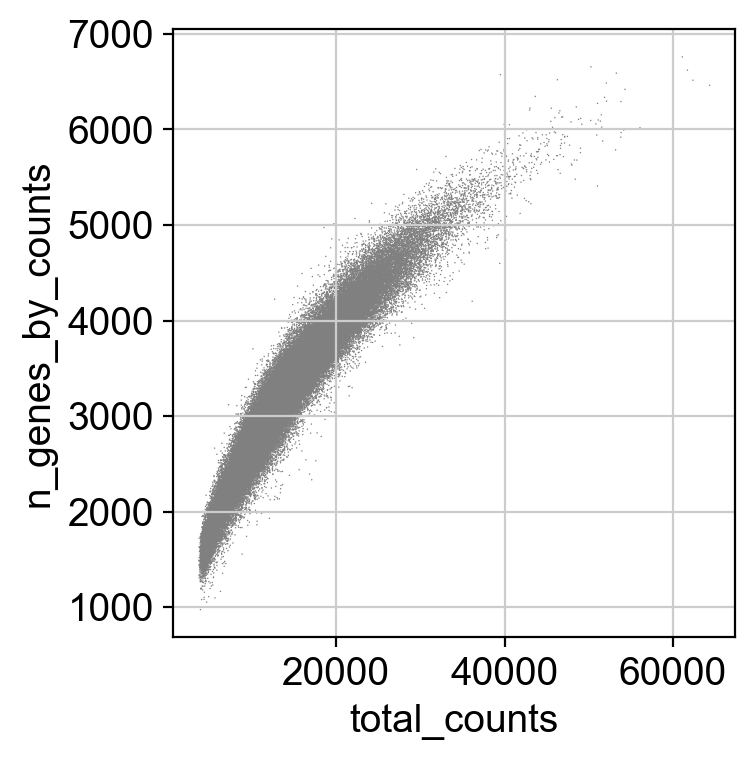

In [2]:
# %load block1_init.py
# metalabels
adata.uns['preprocessing_nb_link'] = f'https://nbviewer.org/github/theislab/sc-pert/blob/main/datasets/{author_year}_curation.ipynb'
adata.uns['doi'] = doi
display(adata.obs.describe(include='all').T.head(20))

# use gene symbols as gene names
if var_genes:
    adata.var[var_genes] = adata.var[var_genes].astype(str)
    adata.var = adata.var.reset_index().set_index(var_genes)
    print(adata.var_names)

# filtering and processing
sc.pp.filter_cells(adata, min_genes=200)
sc.pp.filter_genes(adata, min_cells=20)
adata.var_names_make_unique()

adata.var['mt'] = adata.var_names.str.startswith('MT-')  # annotate the group of mitochondrial genes as 'mt'
sc.pp.calculate_qc_metrics(adata, qc_vars=['mt'], percent_top=None, log1p=False, inplace=True)

sc.pl.violin(adata, ['n_genes_by_counts', 'total_counts', 'pct_counts_mt'], jitter=0.4, multi_panel=True)
sc.pl.scatter(adata, x='total_counts', y='pct_counts_mt')
sc.pl.scatter(adata, x='total_counts', y='n_genes_by_counts')

In [3]:
adata = adata[adata.obs.n_genes_by_counts < 6000, :]  # edit
adata = adata[adata.obs.pct_counts_mt < 15]

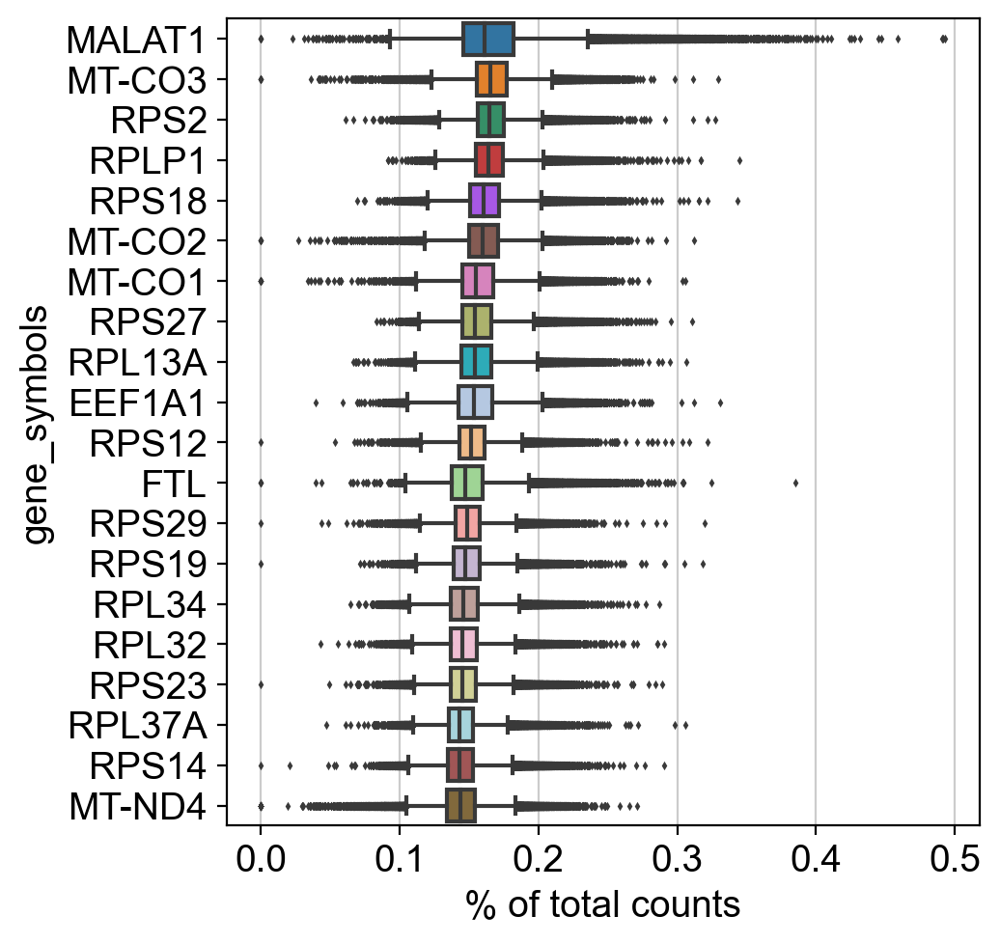

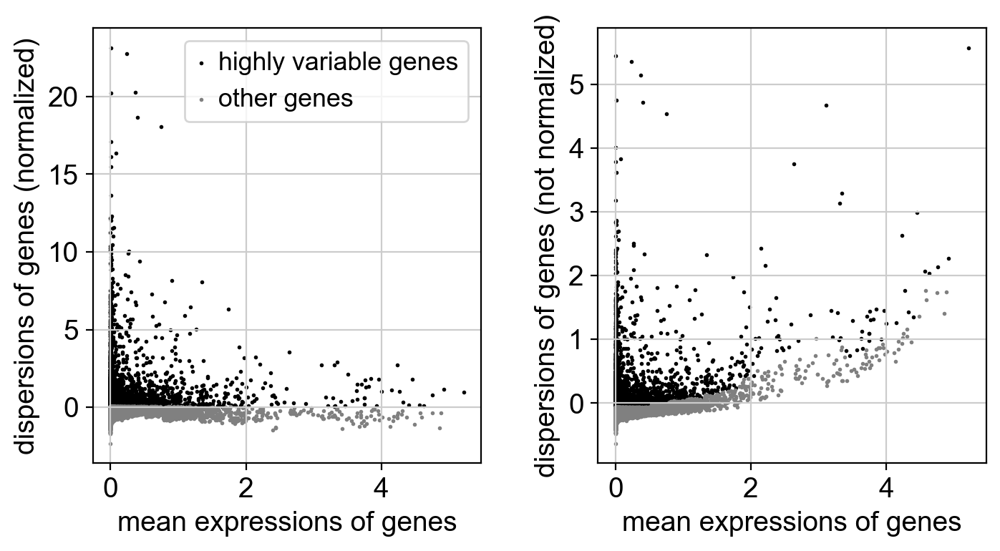

In [4]:
# %load block2_process.py
if is_counts:
    adata.layers['counts'] = adata.X
    sc.pp.normalize_total(adata, target_sum=1e4)
    sc.pp.log1p(adata)

sc.pl.highest_expr_genes(adata, n_top=20)
sc.pp.highly_variable_genes(adata, n_top_genes=5000, subset=False)
sc.pl.highly_variable_genes(adata)

# pre-compute plots
sc.tl.pca(adata, use_highly_variable=True)
sc.pp.neighbors(adata)
sc.tl.leiden(adata)
sc.tl.umap(adata)

In [5]:
sc.write(f'{author_year}.h5ad', adata, compression='gzip')
adata

AnnData object with n_obs × n_vars = 111255 × 19018
    obs: 'guide_identity', 'read_count', 'UMI_count', 'coverage', 'gemgroup', 'good_coverage', 'number_of_cells', 'guide_AHR', 'guide_ARID1A', 'guide_ARRDC3', 'guide_ATL1', 'guide_BAK1', 'guide_BCL2L11', 'guide_BCORL1', 'guide_BPGM', 'guide_C19orf26', 'guide_C3orf72', 'guide_CBFA2T3', 'guide_CBL', 'guide_CDKN1A', 'guide_CDKN1B', 'guide_CDKN1C', 'guide_CEBPA', 'guide_CEBPB', 'guide_CEBPE', 'guide_CELF2', 'guide_CITED1', 'guide_CKS1B', 'guide_CLDN6', 'guide_CNN1', 'guide_CNNM4', 'guide_COL1A1', 'guide_COL2A1', 'guide_CSRNP1', 'guide_DLX2', 'guide_DUSP9', 'guide_EGR1', 'guide_ELMSAN1', 'guide_ETS2', 'guide_FEV', 'guide_FOSB', 'guide_FOXA1', 'guide_FOXA3', 'guide_FOXF1', 'guide_FOXL2', 'guide_FOXO4', 'guide_GLB1L2', 'guide_HES7', 'guide_HK2', 'guide_HNF4A', 'guide_HOXA13', 'guide_HOXB9', 'guide_HOXC13', 'guide_IER5L', 'guide_IGDCC3', 'guide_IKZF3', 'guide_IRF1', 'guide_ISL2', 'guide_JUN', 'guide_KIAA1804', 'guide_KIF18B', 'guide_KIF2C', '

In [2]:
adata = sc.read(f'{author_year}.h5ad')

In [6]:
# %load block3_standardize.py
# the following fields are meant to serve as a template
control = ''
replace_dict = {
    control: 'control',
}
adata.obs['perturbation_name'] = adata.obs['guide_ids'].replace(replace_dict)
adata.obs['perturbation_name'] = ['+'.join(s.split(',')) for s in adata.obs['perturbation_name'].values]
adata.obs['perturbation_type'] = 'genetic'
adata.obs['perturbation_value'] = np.nan
adata.obs['perturbation_unit'] = np.nan

In [7]:
sc.write(f'{author_year}.h5ad', adata, compression='gzip')
adata

/home/icb/yuge.ji/miniconda3/envs/py37/lib/python3.7/site-packages/anndata/_core/anndata.py:1220: FutureWarning: The `inplace` parameter in pandas.Categorical.reorder_categories is deprecated and will be removed in a future version. Reordering categories will always return a new Categorical object.
  c.reorder_categories(natsorted(c.categories), inplace=True)
... storing 'perturbation_type' as categorical


AnnData object with n_obs × n_vars = 111255 × 19018
    obs: 'guide_identity', 'read_count', 'UMI_count', 'coverage', 'gemgroup', 'good_coverage', 'number_of_cells', 'guide_AHR', 'guide_ARID1A', 'guide_ARRDC3', 'guide_ATL1', 'guide_BAK1', 'guide_BCL2L11', 'guide_BCORL1', 'guide_BPGM', 'guide_C19orf26', 'guide_C3orf72', 'guide_CBFA2T3', 'guide_CBL', 'guide_CDKN1A', 'guide_CDKN1B', 'guide_CDKN1C', 'guide_CEBPA', 'guide_CEBPB', 'guide_CEBPE', 'guide_CELF2', 'guide_CITED1', 'guide_CKS1B', 'guide_CLDN6', 'guide_CNN1', 'guide_CNNM4', 'guide_COL1A1', 'guide_COL2A1', 'guide_CSRNP1', 'guide_DLX2', 'guide_DUSP9', 'guide_EGR1', 'guide_ELMSAN1', 'guide_ETS2', 'guide_FEV', 'guide_FOSB', 'guide_FOXA1', 'guide_FOXA3', 'guide_FOXF1', 'guide_FOXL2', 'guide_FOXO4', 'guide_GLB1L2', 'guide_HES7', 'guide_HK2', 'guide_HNF4A', 'guide_HOXA13', 'guide_HOXB9', 'guide_HOXC13', 'guide_IER5L', 'guide_IGDCC3', 'guide_IKZF3', 'guide_IRF1', 'guide_ISL2', 'guide_JUN', 'guide_KIAA1804', 'guide_KIF18B', 'guide_KIF2C', '

View.

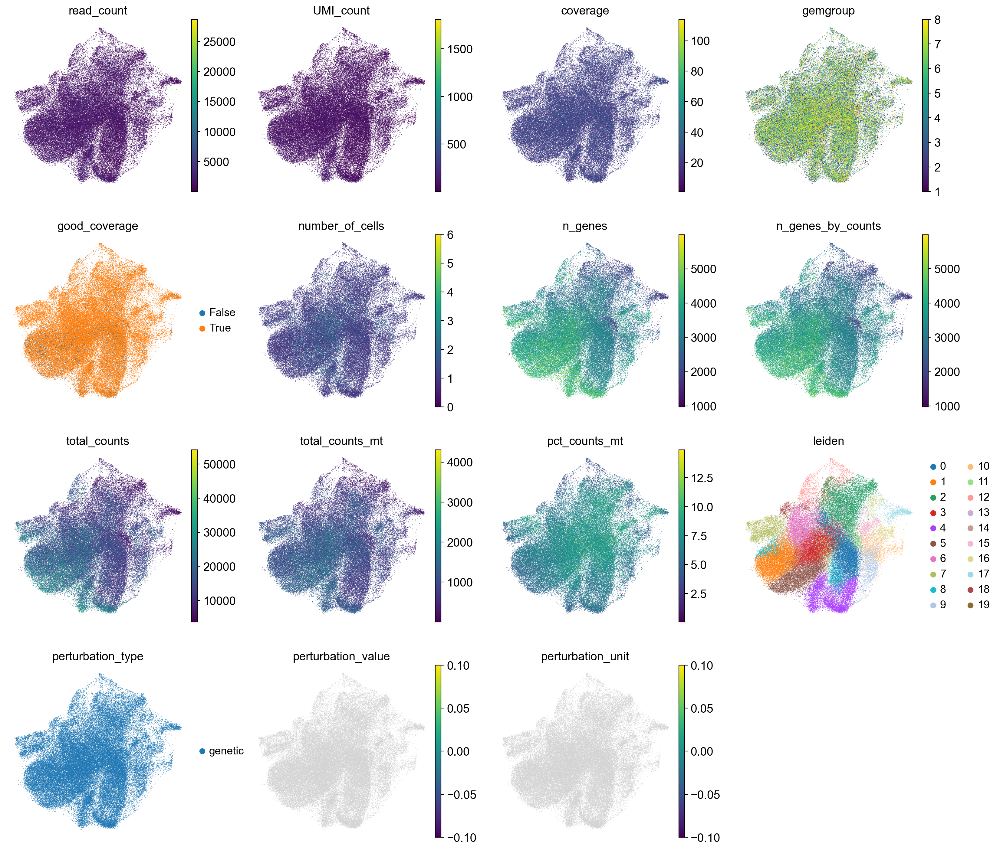

In [8]:
plot_cols = [c for c in adata.obs.columns \
             if (len(adata.obs[c].unique()) < 30 or not hasattr(adata.obs[c], 'cat')) and 'guide' not in c]
for c in plot_cols:
    if adata.obs[c].dtype == 'bool':
        adata.obs[c] = adata.obs[c].astype('category')
sc.pl.umap(adata, color=plot_cols)

Plot the top 50 most common perturbations.

Trying to set attribute `.obs` of view, copying.
... storing 'perturbation_name' as categorical


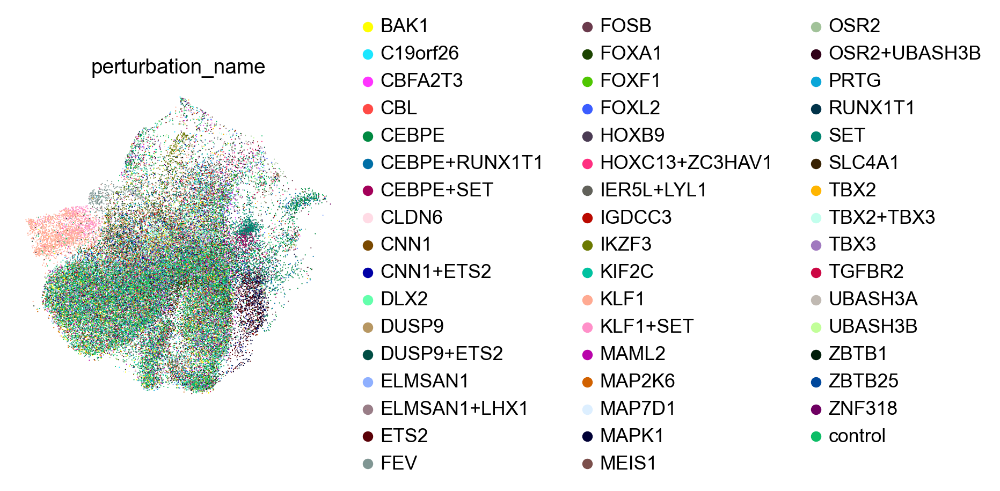

In [11]:
sc.pl.umap(
    adata[adata.obs.perturbation_name.isin((adata.obs.perturbation_name.value_counts().index[:50]))],
    color='perturbation_name')